In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from glob import glob

In [2]:
import lib.marking_evaluation as meval

In [3]:
def plot_team(team):
    adversary = meval.default_adversary_1
    team = [float(i) for i in team.replace('[','').replace(']','').replace(' ','').split(',')]
    aux = []
    for i in range(10):
        aux.append([team[2*i], team[2*i+1]])
    team = meval.create_team(aux)

    adversary.plot_result(team)

In [4]:
meval.default_adversary_1.plot_team(dpi=1200)
plt.savefig('img/100_default_adversary.pdf', format='pdf', bbox_inches='tight')

# Random Search

In [5]:
res_random_search_da1 = pd.read_csv('results/random_search_daThuJun100502472021.csv')

In [6]:
res_random_search_da1.fitness.max(), res_random_search_da1.cycle_time.sum()

(2.744731906847829, 9586.748977661133)

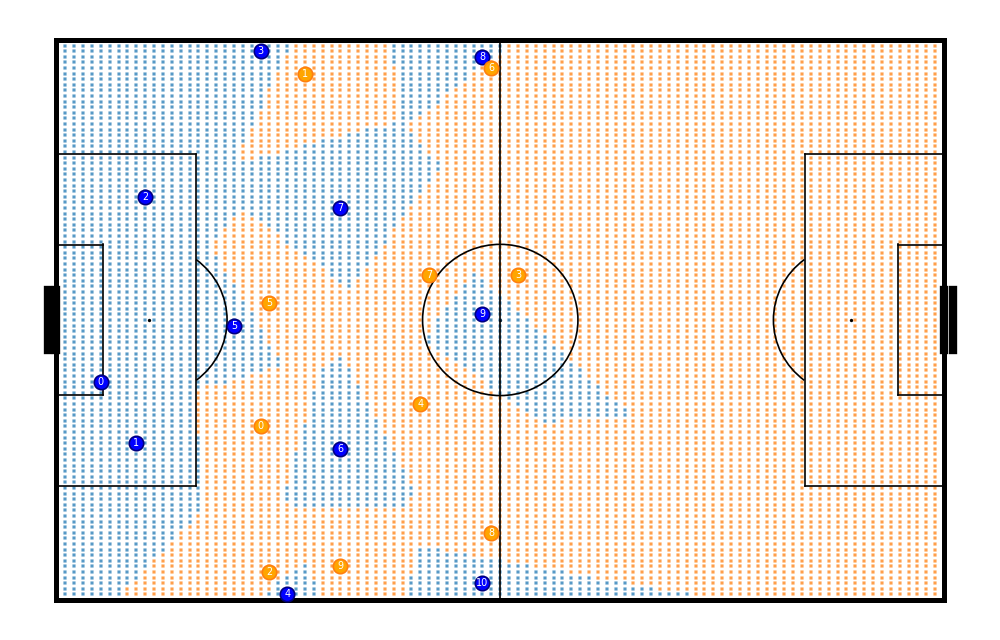

In [7]:
plot_team(res_random_search_da1[res_random_search_da1.fitness == res_random_search_da1.fitness.max()].proposal.iloc[0])

# Optuna CMA-ES

In [8]:
res_optunacmaes_da1 = [pd.read_csv(f) for f in glob('results/optunacmaes*.csv')]
best_optunacmaes_da1 = [df.fitness.max() for df in res_optunacmaes_da1].index(max([df.fitness.max() for df in res_optunacmaes_da1]))
best_optunacmaes_da1

0

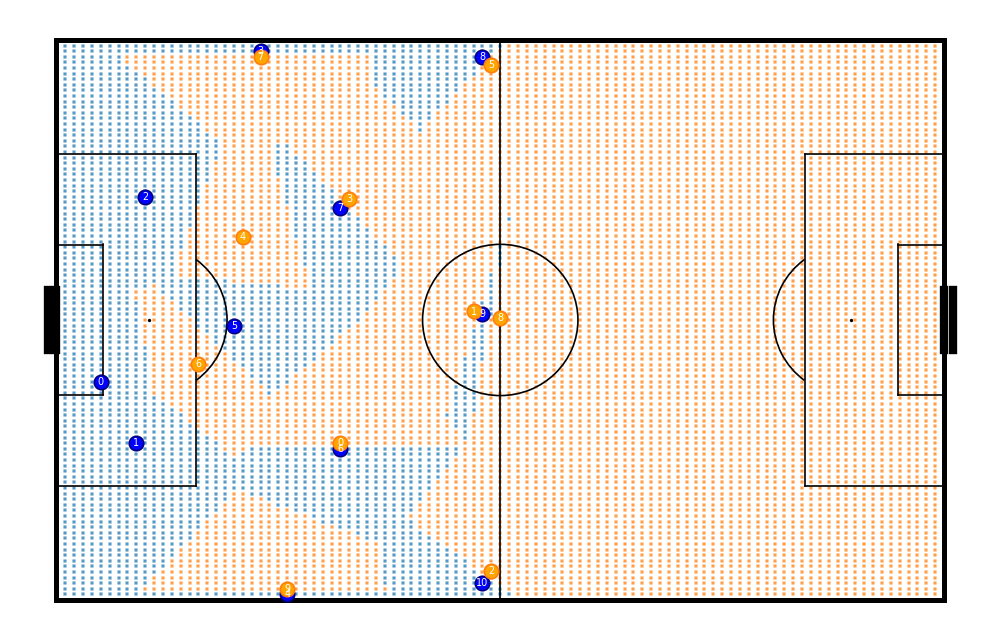

In [9]:
plot_team(res_optunacmaes_da1[0][res_optunacmaes_da1[0].fitness == res_optunacmaes_da1[0].fitness.max()].proposal.iloc[0])

# Optuna TPE

In [11]:
res_optunatpe_da1 = [pd.read_csv(f) for f in glob('results/optunatpe*.csv')]
best_optunatpe_da1 = [df.fitness.max() for df in res_optunatpe_da1].index(max([df.fitness.max() for df in res_optunatpe_da1]))
best_optunatpe_da1

10

In [10]:
plot_team(res_optunatpe_da1[10][res_optunatpe_da1[10].fitness == res_optunatpe_da1[10].fitness.max()].proposal.iloc[0])

NameError: name 'res_optunatpe_da1' is not defined

# Hill climb   

In [12]:
res_hillclimb_da1_s = [pd.read_csv(f) for f in glob('results/hill*.csv')]
best_hillclimb_da1_s = [df.fitness.max() for df in res_hillclimb_da1_s].index(max([df.fitness.max() for df in res_hillclimb_da1_s]))
best_hillclimb_da1_s

17

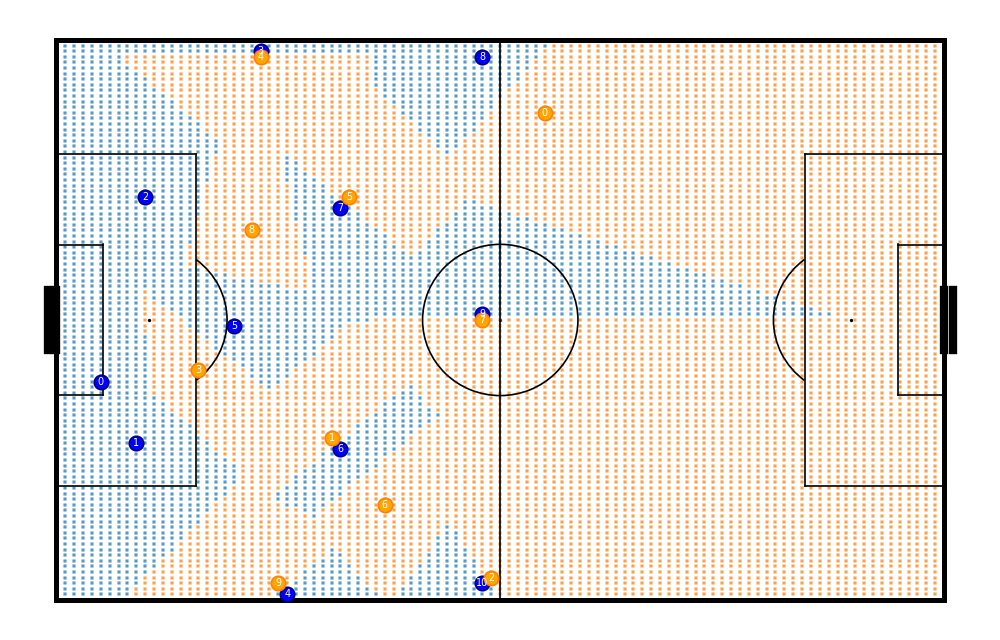

In [13]:
plot_team(res_hillclimb_da1_s[4][res_hillclimb_da1_s[4].fitness == res_hillclimb_da1_s[4].fitness.max()].proposal.iloc[0])

# Simulated Annealing

In [14]:
res_simannealing_da1_s = [pd.read_csv(f) for f in glob('results/simula*.csv')]
best_simannealing_da1_s = [df.fitness.max() for df in res_simannealing_da1_s].index(max([df.fitness.max() for df in res_simannealing_da1_s]))
best_simannealing_da1_s

2

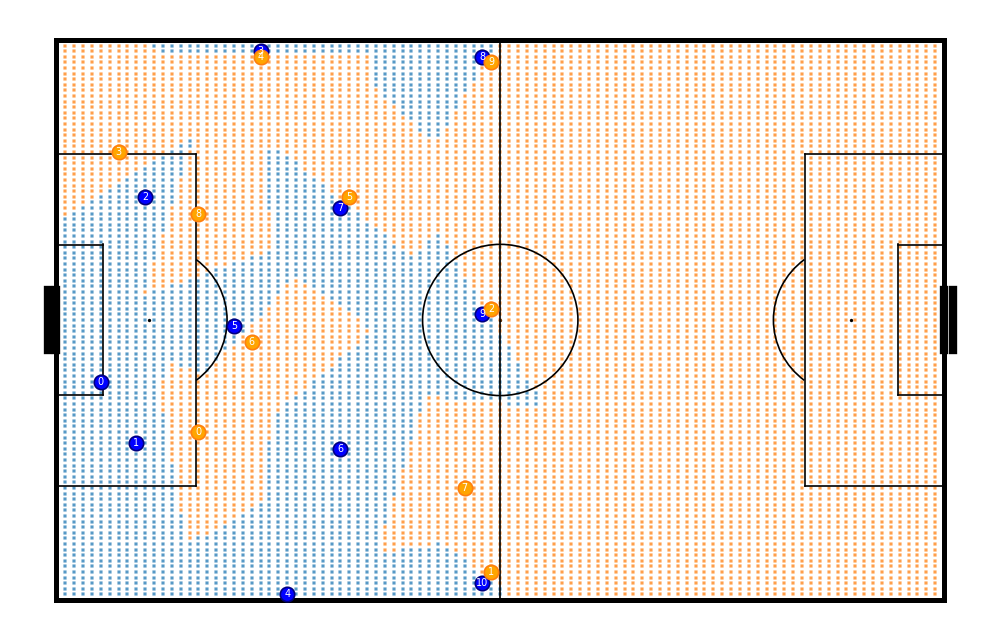

In [15]:
plot_team(res_simannealing_da1_s[6][res_simannealing_da1_s[6].fitness == res_simannealing_da1_s[6].fitness.max()].proposal.iloc[0])

# Genetic Algorithms

In [16]:
res_genetic_da1_s = [pd.read_csv(f) for f in glob('results/gen*.csv')]
best_genetic_da1_s = [df.fitness.max() for df in res_genetic_da1_s].index(max([df.fitness.max() for df in res_genetic_da1_s]))
best_genetic_da1_s

18

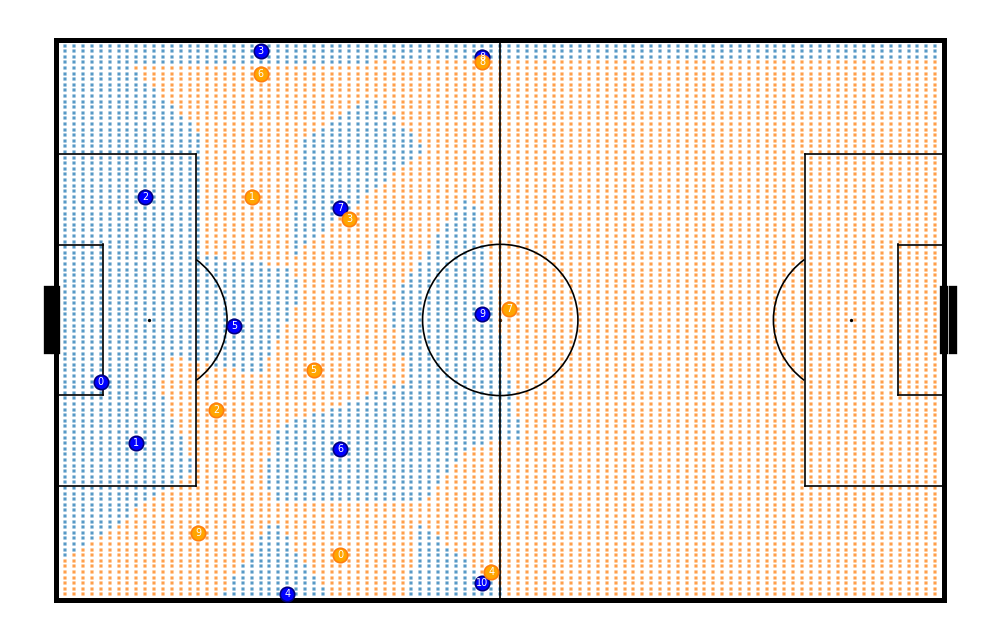

In [17]:
plot_team(res_genetic_da1_s[4][res_genetic_da1_s[4].fitness == res_genetic_da1_s[4].fitness.max()].proposal.iloc[0])

# Evolution plots

In [18]:
plt.style.use('grayscale')
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['figure.dpi'] = 1200
plt.rcParams['figure.figsize'] = (9,4)
plt.rcParams['font.size'] = 18

In [19]:
selected_df = res_optunacmaes_da1[5]

In [20]:
selected_df[selected_df.fitness > selected_df.fitness.max()*0.99], selected_df.fitness.max()

(                                               proposal   fitness  cycle_time
 2582  [[89, 59.84949711542136], [16, 82.891391517514...  3.513883    0.227826
 2609  [[89, 59.98022587457072], [16, 83.755234419901...  3.513301    0.226116
 2625  [[89, 59.671551324994205], [16, 83.81707859932...  3.514303    0.228709
 2628  [[89, 59.95432543993465], [15, 82.702335379155...  3.516662    0.227657
 2652  [[89, 60.35611145371388], [15, 82.808364028747...  3.514931    0.226781
 ...                                                 ...       ...         ...
 4995  [[88, 59.16221054204367], [13, 80.093325058537...  3.548475    0.232036
 4996  [[88, 59.162032071895666], [13, 80.09172141887...  3.548480    0.233480
 4997  [[88, 59.163516171519035], [13, 80.09054326099...  3.548697    0.233389
 4998  [[88, 59.162962252784716], [13, 80.09378000665...  3.548700    0.231710
 4999  [[88, 59.165028315602555], [13, 80.09147848231...  3.548703    0.230839
 
 [1674 rows x 3 columns],
 3.5487119063639296)

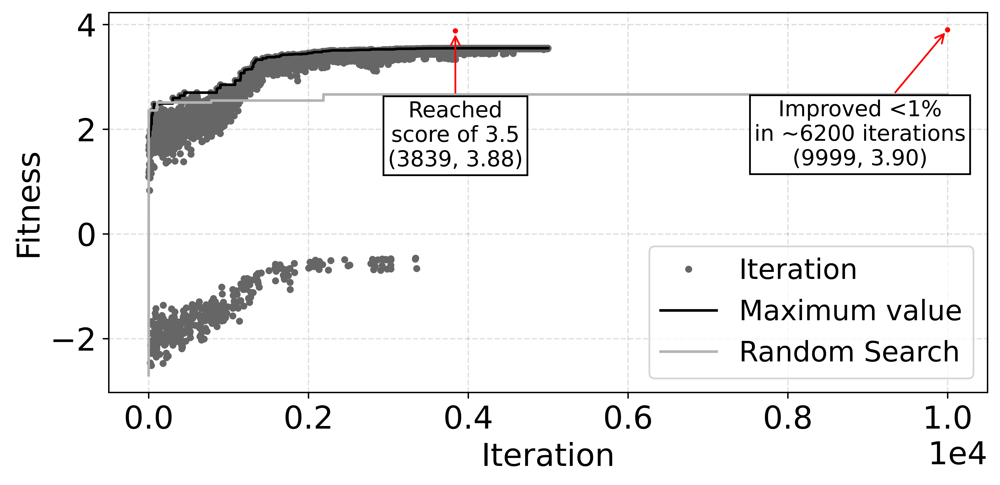

In [21]:
plt.plot(selected_df.fitness, marker='.', linestyle='', color='C1', label='Iteration')
plt.plot(selected_df.fitness.rolling(25000, min_periods=1).max(), color='C0', label='Maximum value')
plt.plot(res_random_search_da1.fitness.iloc[:10000].rolling(25000, min_periods=1).max(), color='C3', label='Random Search')
plt.ylabel('Fitness')
plt.xlabel('Iteration')
plt.annotate('Reached\nscore of 3.5\n(3839, 3.88)', xy=(3839, 3.88), xytext=(0,-60), textcoords='offset points', ha='center', va='center', fontsize='x-small', bbox=dict(boxstyle='square,pad=0.2', fc='white'), arrowprops=dict(arrowstyle='->', color='red'))
plt.annotate('Improved <1%\nin ~6200 iterations\n(9999, 3.90)', xy=(9999, 3.90), xytext=(-50,-60), textcoords='offset points', ha='center', va='center', fontsize='x-small', bbox=dict(boxstyle='square,pad=0.2', fc='white'), arrowprops=dict(arrowstyle='->', color='red'))
plt.scatter([3839, 9999], [3.88, 3.90], s=4, color='red', zorder = 3)
plt.grid(alpha=0.12, linestyle='--')
plt.legend(prop={'size': 16});
plt.ticklabel_format(axis='x', style='sci', scilimits=[0, 2])
plt.savefig('img/002_cmaes.pdf', format='pdf', bbox_inches='tight')

In [22]:
a = [df.cycle_time.sum() for df in res_optunacmaes_da1]
np.median(a) / res_random_search_da1.cycle_time.median()

4888.896246912882

In [23]:
a = [df.cycle_time.sum() for df in res_optunatpe_da1]
np.median(a) / res_random_search_da1.cycle_time.median()

10031.495673976777

In [24]:
a = [df.groupby('iteration').max().cycle_time.sum() for df in res_hillclimb_da1_s]
np.median(a) / res_random_search_da1.cycle_time.median()

1979.7465398201646

In [25]:
a = [df.groupby('iteration').max().cycle_time.sum() for df in res_simannealing_da1_s]
np.median(a) / res_random_search_da1.cycle_time.median()

4347.360387306741

In [26]:
a = [df.groupby('iteration').max().cycle_time.sum() for df in res_genetic_da1_s]
np.median(a) / res_random_search_da1.cycle_time.median()

7483.990194071145

In [27]:
res_random_search_da1.fitness.rolling(25000, min_periods=1).max().iloc[5285], res_random_search_da1.fitness.rolling(25000, min_periods=1).max().iloc[8438], res_random_search_da1.fitness.rolling(25000, min_periods=1).max().iloc[13380], 

(2.6653413028926805, 2.6653413028926805, 2.6653413028926805)

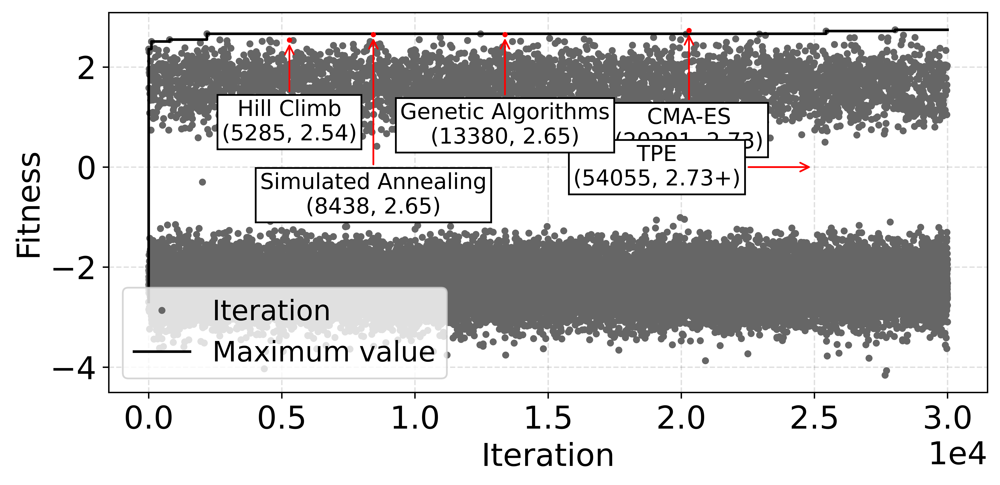

In [28]:
plt.plot(res_random_search_da1.fitness, marker='.', linestyle='', color='C1', label='Iteration')
plt.plot(res_random_search_da1.fitness.rolling(25000, min_periods=1).max(), color='C0', label='Maximum value')
plt.ylabel('Fitness')
plt.xlabel('Iteration')
plt.annotate('CMA-ES\n(20291, 2.73)', xy=(20291, 2.73), xytext=(0,-70), textcoords='offset points', ha='center', va='bottom', fontsize='x-small', bbox=dict(boxstyle='square,pad=0.2', fc='white'), arrowprops=dict(arrowstyle='->', color='red'))
plt.annotate('TPE\n(54055, 2.73+)', xy=(25000, 0), xytext=(-90,0), textcoords='offset points', ha='center', va='center', fontsize='x-small', bbox=dict(boxstyle='square,pad=0.2', fc='white'), arrowprops=dict(arrowstyle='->', color='red'))
plt.annotate('Hill Climb\n(5285, 2.54)', xy=(5285, 2.54), xytext=(0,-60), textcoords='offset points', ha='center', va='bottom', fontsize='x-small', bbox=dict(boxstyle='square,pad=0.2', fc='white'), arrowprops=dict(arrowstyle='->', color='red'))
plt.annotate('Simulated Annealing\n(8438, 2.65)', xy=(8438, 2.65), xytext=(0,-105), textcoords='offset points', ha='center', va='bottom', fontsize='x-small', bbox=dict(boxstyle='square,pad=0.2', fc='white'), arrowprops=dict(arrowstyle='->', color='red'))
plt.annotate('Genetic Algorithms\n(13380, 2.65)', xy=(13380, 2.65), xytext=(0,-65), textcoords='offset points', ha='center', va='bottom', fontsize='x-small', bbox=dict(boxstyle='square,pad=0.2', fc='white'), arrowprops=dict(arrowstyle='->', color='red'))
plt.scatter([5285, 8438, 13380, 20291], [2.54, 2.65, 2.65, 2.73], s=4, color='red', zorder = 3)
plt.grid(alpha=0.12, linestyle='--')
plt.legend(loc='lower left', prop={'size': 16});
plt.ticklabel_format(axis='x', style='sci', scilimits=[0, 2])
plt.savefig('img/001_random_search.pdf', format='pdf', bbox_inches='tight')

In [29]:
plt.plot(res_optunatpe_da1.fitness, marker='.', linestyle='', color='C1', label='Iteration')
plt.plot(res_optunatpe_da1.fitness.rolling(25000, min_periods=1).max(), color='C0', label='Maximum value')
plt.plot(res_random_search_da1.fitness.iloc[:10000].rolling(25000, min_periods=1).max(), color='C3', label='Random Search')
plt.ylabel('Fitness')
plt.xlabel('Iteration')
plt.annotate('Many unproductive iterations\nacross all iteration range', xy=(8000, -1.2), xytext=(0,-45), textcoords='offset points', ha='center', va='bottom', fontsize='x-small', bbox=dict(boxstyle='square,pad=0.2', fc='white'), arrowprops=dict(arrowstyle='->', color='red'))
plt.scatter(8000, -1.2, s=3000, marker='H', alpha=1, edgecolor='red')
plt.annotate('Fails to improve\nlocal minimum\n(3458-6594, 3.40)', xy=(5000, 3.4), xytext=(0,-90), textcoords='offset points', ha='center', va='center', fontsize='x-small', bbox=dict(boxstyle='square,pad=0.2', fc='white'), arrowprops=dict(arrowstyle='->', color='red'))
plt.annotate('Reached\nscore of 3.47\n(6595, 3.47)', xy=(6595, 3.47), xytext=(0,-60), textcoords='offset points', ha='center', va='bottom', fontsize='x-small', bbox=dict(boxstyle='square,pad=0.2', fc='white'), arrowprops=dict(arrowstyle='->', color='red'))
plt.scatter([6595], [3.47], s=4, color='red', zorder = 3)
plt.plot([3458, 6594], [3.4, 3.4], color='red')
plt.grid(alpha=0.12, linestyle='--')
plt.legend(loc='lower left', prop={'size': 16});
plt.ticklabel_format(axis='x', style='sci', scilimits=[0, 2])
plt.savefig('img/003_tpe.pdf', format='pdf', bbox_inches='tight')

AttributeError: 'list' object has no attribute 'fitness'

In [ ]:
for df in res_hillclimb_da1_s:
    df = df.drop_duplicates()
    plt.plot(df.fitness.rolling(25000, min_periods=1).max(), color='C0', alpha=0.8, label='Maximum value')
plt.plot(res_hillclimb_da1_s[4].fitness.rolling(25000, min_periods=1).max(), color='red', alpha=0.8, label='Best performance')
plt.plot(res_hillclimb_da1_s[9].fitness.rolling(25000, min_periods=1).max(), color='chocolate', alpha=0.8, label='Worst performance')
plt.plot(res_random_search_da1.fitness.iloc[:4000].rolling(25000, min_periods=1).max(), color='C3', label='Random Search')
plt.ylabel('Fitness')
plt.xlabel('Iteration')
plt.grid(alpha=0.12, linestyle='--')
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), prop={'size': 16});
plt.ticklabel_format(axis='x', style='sci', scilimits=[0, 2])
plt.savefig('img/004_hillclimb.pdf', format='pdf', bbox_inches='tight')

In [ ]:
res_simannealing_da1_s[7][res_simannealing_da1_s[7].fitness.max() == res_simannealing_da1_s[7].fitness].iloc[0]

In [ ]:
for df in res_simannealing_da1_s:
    df = df.drop_duplicates()
    plt.plot(df.fitness.rolling(25000, min_periods=1).max(), color='C0', alpha=0.8, label='Maximum value')
plt.plot(res_simannealing_da1_s[6].fitness.rolling(25000, min_periods=1).max(), color='red', alpha=0.8, label='Best performance')
plt.plot(res_simannealing_da1_s[5].fitness.rolling(25000, min_periods=1).max(), color='chocolate', alpha=0.8, label='Worst performance')
plt.plot(res_random_search_da1.fitness.iloc[:9000].rolling(25000, min_periods=1).max(), color='C3', label='Random Search')
plt.ylabel('Fitness')
plt.xlabel('Iteration')

# plt.annotate('Reached\nscore of 3.89\n(281, 3.89)', xy=(281, 3.89), xytext=(0,-50), textcoords='offset points', ha='center', va='bottom', fontsize='x-small', bbox=dict(boxstyle='square,pad=0.2', fc='white', alpha=0.6), arrowprops=dict(arrowstyle='->', color='red'))

plt.grid(alpha=0.12, linestyle='--')
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), prop={'size': 16});
plt.ticklabel_format(axis='x', style='sci', scilimits=[0, 2])
plt.savefig('img/005_simulatedannealing.pdf', format='pdf', bbox_inches='tight')

In [ ]:
for df in res_genetic_da1_s:
    df = df.drop_duplicates()
    plt.plot(df.fitness.rolling(25000, min_periods=1).max(), color='C0', alpha=0.8, label='Maximum value')
plt.plot(res_genetic_da1_s[4].fitness.rolling(25000, min_periods=1).max(), color='red', alpha=0.8, label='Best performance')
plt.plot(res_genetic_da1_s[2].fitness.rolling(25000, min_periods=1).max(), color='chocolate', alpha=0.8, label='Worst performance')
plt.plot(res_random_search_da1.fitness.iloc[:16000].rolling(25000, min_periods=1).max(), color='C3', label='Random Search')
plt.ylabel('Fitness')
plt.xlabel('Iteration')
plt.grid(alpha=0.12, linestyle='--')
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), prop={'size': 16});
plt.ticklabel_format(axis='x', style='sci', scilimits=[0, 2])
plt.savefig('img/006_geneticalgo.pdf', format='pdf', bbox_inches='tight')

In [ ]:
plt.plot(res_random_search_da1.fitness.rolling(25000, min_periods=1).max(), color='C0', label='Random Search')
plt.plot(res_optunacmaes_da1.fitness.rolling(25000, min_periods=1).max(), color='tab:orange', label='CMA-ES')
plt.plot(res_optunatpe_da1.fitness.rolling(25000, min_periods=1).max(), color='tab:red', label='TPE')
plt.plot(res_hillclimb_da1_s[4].fitness.rolling(25000, min_periods=1).max(), color='tab:cyan', alpha=0.8, label='Hill Climb')
plt.plot(res_simannealing_da1_s[6].fitness.rolling(25000, min_periods=1).max(), color='tab:blue', alpha=0.8, label='Simulated Annealing')
plt.plot(res_genetic_da1_s[4].fitness.rolling(25000, min_periods=1).max(), color='tab:green', alpha=0.8, label='Genetic Algorithm')
plt.xlabel('Iteration')
plt.ylabel('Fitness')
plt.legend(prop={'size': 16});
plt.ticklabel_format(axis='x', style='sci', scilimits=[0, 2])
plt.ylim([1, 4])
plt.savefig('img/007_allalgo.pdf', format='pdf', bbox_inches='tight')

In [ ]:
df = res_hillclimb_da1_s[4]
gbdf = df.groupby('iteration').min().cycle_time / 40
gbdf.mean()

In [ ]:
df = res_simannealing_da1_s[6]
gbdf = df.groupby('iteration').min().cycle_time / 40
gbdf.mean()

In [ ]:
df = res_genetic_da1_s[4]
gbdf = df.groupby('iteration').min().cycle_time / 40
gbdf.mean()

In [ ]:
plt.plot(res_random_search_da1.cycle_time.rolling(25000, min_periods=1).sum(), res_random_search_da1.fitness.rolling(25000, min_periods=1).max(), color='C0', label='Random Search')
plt.plot(res_optunacmaes_da1.cycle_time.rolling(25000, min_periods=1).sum(), res_optunacmaes_da1.fitness.rolling(25000, min_periods=1).max(), color='tab:orange', label='CMA-ES')
plt.plot(res_optunatpe_da1.cycle_time.rolling(25000, min_periods=1).sum(), res_optunatpe_da1.fitness.rolling(25000, min_periods=1).max(), color='tab:red', label='TPE')
plt.plot(res_hillclimb_da1_s[4].index * 0.3625485784904932, res_hillclimb_da1_s[4].fitness.rolling(25000, min_periods=1).max(), color='tab:cyan', alpha=0.8, label='Hill Climb')
plt.plot(res_simannealing_da1_s[6].index * 0.33508022939949705, res_simannealing_da1_s[6].fitness.rolling(25000, min_periods=1).max(), color='tab:blue', alpha=0.8, label='Simulated Annealing')
plt.plot(res_genetic_da1_s[4].index * 0.3591119649386642, res_genetic_da1_s[4].fitness.rolling(25000, min_periods=1).max(), color='tab:green', alpha=0.8, label='Genetic Algorithm')
plt.xlabel('Time spent (s)')
plt.ylabel('Fitness')
plt.legend(prop={'size': 16});
plt.ticklabel_format(axis='x', style='sci', scilimits=[0, 2])
plt.ylim([1, 4])
plt.savefig('img/008_allalgotime.pdf', format='pdf', bbox_inches='tight')

In [ ]:
# Worst

In [ ]:
plt.plot(res_random_search_da1.cycle_time.rolling(25000, min_periods=1).sum(), res_random_search_da1.fitness.rolling(25000, min_periods=1).max(), color='C0', label='Random Search')
plt.plot(res_optunacmaes_da1.cycle_time.rolling(25000, min_periods=1).sum(), res_optunacmaes_da1.fitness.rolling(25000, min_periods=1).max(), color='tab:orange', label='CMA-ES')
plt.plot(res_optunatpe_da1.cycle_time.rolling(25000, min_periods=1).sum(), res_optunatpe_da1.fitness.rolling(25000, min_periods=1).max(), color='tab:red', label='TPE')
plt.plot(res_hillclimb_da1_s[9].index * 0.3625485784904932, res_hillclimb_da1_s[9].fitness.rolling(25000, min_periods=1).max(), color='tab:cyan', alpha=0.8, label='Hill Climb')
plt.plot(res_simannealing_da1_s[5].index * 0.33508022939949705, res_simannealing_da1_s[5].fitness.rolling(25000, min_periods=1).max(), color='tab:blue', alpha=0.8, label='Simulated Annealing')
plt.plot(res_genetic_da1_s[2].index * 0.3591119649386642, res_genetic_da1_s[2].fitness.rolling(25000, min_periods=1).max(), color='tab:green', alpha=0.8, label='Genetic Algorithm')
plt.xlabel('Time spent (s)')
plt.ylabel('Fitness')
plt.legend(prop={'size': 16});
plt.ticklabel_format(axis='x', style='sci', scilimits=[0, 2])
plt.ylim([1, 4])
plt.savefig('img/008_allalgotime_worst.pdf', format='pdf', bbox_inches='tight')